# Importing Module


In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import math
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
import tensorflow as tf

import warnings
pd.set_option('display.max_columns', None)
warnings.filterwarnings("ignore")

# Exploring the data

In [2]:
df = pd.read_csv('F:\house-dataset.csv',index_col='Id')
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
df.tail()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,NaN,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125
1460,20,RL,75.0,9937,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,CBlock,TA,TA,No,BLQ,830,LwQ,290,136,1256,GasA,Gd,Y,SBrkr,1256,0,0,1256,1,0,1,1,3,1,TA,6,Typ,0,NaN,Attchd,1965.0,Fin,1,276,TA,TA,Y,736,68,0,0,0,0,NaN,NaN,NaN,0,6,2008,WD,Normal,147500


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1460 entries, 1 to 1460
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuilt    

In [5]:
df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


# Data Cleaning

## Dealing with missing values

In [6]:
print("Percentage of Nan in each Column")
for column, percentage in ((df.isna().sum() / df.shape[0]) * 100).items():
    count = math.ceil(percentage)
    if count > 0:
        print(f"{column} : {count} %")

Percentage of Nan in each Column
LotFrontage : 18 %
Alley : 94 %
MasVnrType : 60 %
MasVnrArea : 1 %
BsmtQual : 3 %
BsmtCond : 3 %
BsmtExposure : 3 %
BsmtFinType1 : 3 %
BsmtFinType2 : 3 %
Electrical : 1 %
FireplaceQu : 48 %
GarageType : 6 %
GarageYrBlt : 6 %
GarageFinish : 6 %
GarageQual : 6 %
GarageCond : 6 %
PoolQC : 100 %
Fence : 81 %
MiscFeature : 97 %


In [7]:
df.drop(columns=['MasVnrType','PoolQC','PoolArea','BsmtHalfBath','KitchenAbvGr','Utilities'],inplace=True)

In [8]:
df['LotFrontage'] = df['LotFrontage'].fillna(0)
df['Alley'] = df['Alley'].fillna("No Alley Acess")
df['MasVnrArea'] = df['MasVnrArea'].fillna(df['MasVnrArea'].mean())
df['LotFrontage'] = df['LotFrontage'].fillna(0)
df['BsmtQual'] = df['BsmtQual'].fillna("No Basment")
df['BsmtCond'] = df['BsmtCond'].fillna("No Basment")
df['BsmtExposure'] = df['BsmtExposure'].fillna("No Basment")
df['BsmtFinType1'] = df['BsmtFinType1'].fillna("No Basment")
df['BsmtFinType2'] = df['BsmtFinType2'].fillna("No Basment")
df['Electrical'] = df['Electrical'].fillna(df['Electrical'].mode()[0])
df['FireplaceQu'] = df['FireplaceQu'].fillna("No Fireplace")
df['GarageType'] = df['GarageType'].fillna("No Garage")
df['GarageYrBlt'] = df['GarageYrBlt'].fillna(0)
df['GarageFinish'] = df['GarageFinish'].fillna("No Garage")
df['GarageQual'] = df['GarageQual'].fillna("No Garage")
df['GarageCond'] = df['GarageCond'].fillna("No Garage")
df['Fence'] = df['Fence'].fillna("No Fence")
df['MiscFeature'] = df['MiscFeature'].fillna("No Miscellaneous Feature")


## Removing Outliers

In [9]:
def remove_outlier(df, x):
    df[f'{x}_zscore'] = zscore(df[f'{x}'])
    df.drop(df[(df[f'{x}_zscore'] >= 3) | (df[f'{x}_zscore'] <= -3)].index, inplace=True)
    df.drop(columns=[f'{x}_zscore'], inplace=True)
    

In [10]:
columns = df.select_dtypes('number').columns.tolist()
for column in columns:
    remove_outlier(df, column)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1001 entries, 1 to 1457
Data columns (total 74 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1001 non-null   int64  
 1   MSZoning       1001 non-null   object 
 2   LotFrontage    1001 non-null   float64
 3   LotArea        1001 non-null   int64  
 4   Street         1001 non-null   object 
 5   Alley          1001 non-null   object 
 6   LotShape       1001 non-null   object 
 7   LandContour    1001 non-null   object 
 8   LotConfig      1001 non-null   object 
 9   LandSlope      1001 non-null   object 
 10  Neighborhood   1001 non-null   object 
 11  Condition1     1001 non-null   object 
 12  Condition2     1001 non-null   object 
 13  BldgType       1001 non-null   object 
 14  HouseStyle     1001 non-null   object 
 15  OverallQual    1001 non-null   int64  
 16  OverallCond    1001 non-null   int64  
 17  YearBuilt      1001 non-null   int64  
 18  YearRemodAdd 

In [12]:
df.shape

(1001, 74)

In [13]:
df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SalePrice
count,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000,1001.000000
mean,55.024975,55.664336,9289.864136,6.053946,5.524476,1975.368631,1985.549451,84.297814,416.560440,22.208791,568.288711,1007.057942,1103.766234,322.947053,0.292707,1427.005994,0.381618,1.565435,0.369630,2.812188,6.278721,0.546454,1979.672328,1.810190,479.136863,88.885115,39.817183,13.250749,0.118881,5.208791,14.839161,6.248751,2007.814186,171110.950050
std,39.801688,31.676193,3830.783887,1.253430,0.985723,27.635864,20.522519,132.001834,397.369021,84.511924,427.616819,365.825514,319.603944,404.584550,4.682226,406.913091,0.486027,0.515717,0.482946,0.688978,1.346565,0.595055,24.248598,0.589861,166.960134,106.565312,49.922235,40.553644,3.119432,26.049671,97.684672,2.668157,1.345154,57377.085862
min,20.000000,0.000000,1300.000000,2.000000,3.000000,1890.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,438.000000,0.000000,0.000000,438.000000,0.000000,0.000000,0.000000,1.000000,3.000000,0.000000,1910.000000,1.000000,160.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,35311.000000
25%,20.000000,40.000000,7252.000000,5.000000,5.000000,1957.000000,1968.000000,0.000000,0.000000,0.000000,239.000000,791.000000,864.000000,0.000000,0.000000,1113.000000,0.000000,1.000000,0.000000,2.000000,5.000000,0.000000,1962.000000,1.000000,352.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,130000.000000
50%,50.000000,63.000000,9120.000000,6.000000,5.000000,1977.000000,1995.000000,0.000000,398.000000,0.000000,484.000000,960.000000,1052.000000,0.000000,0.000000,1414.000000,0.000000,2.000000,0.000000,3.000000,6.000000,0.000000,1983.000000,2.000000,474.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,160000.000000
75%,70.000000,76.000000,11040.000000,7.000000,6.000000,2002.000000,2004.000000,143.000000,690.000000,0.000000,810.000000,1234.000000,1314.000000,703.000000,0.000000,1682.000000,1.000000,2.000000,1.000000,3.000000,7.000000,1.000000,2003.000000,2.000000,576.000000,168.000000,62.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,201000.000000
max,180.000000,152.000000,36500.000000,10.000000,8.000000,2009.000000,2010.000000,640.000000,1573.000000,532.000000,1869.000000,2136.000000,2136.000000,1427.000000,80.000000,2727.000000,1.000000,3.000000,1.000000,5.000000,10.000000,2.000000,2010.000000,3.000000,954.000000,441.000000,224.000000,192.000000,96.000000,170.000000,1300.000000,12.000000,2010.000000,354000.000000


# Analysis and Visualization

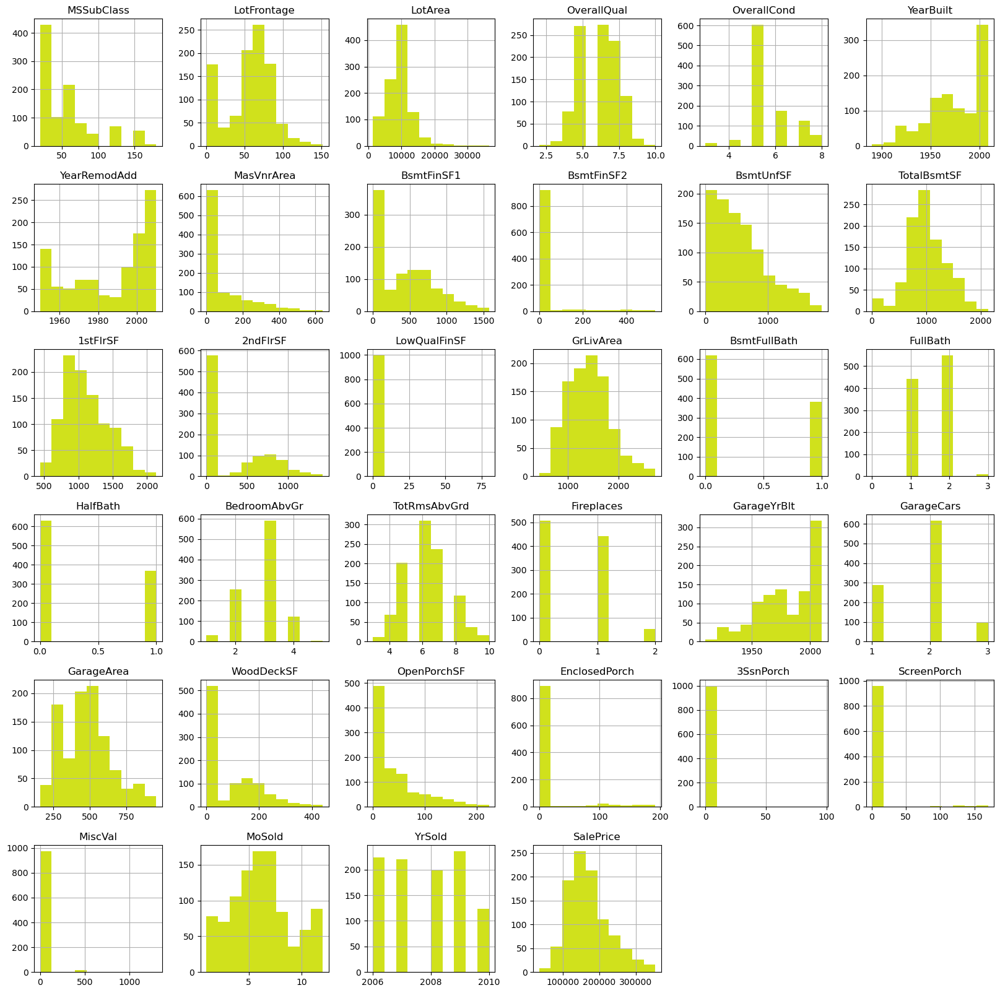

In [14]:
df.hist(figsize=(20, 20), xlabelsize=10, ylabelsize=10,color='#D0E11C');


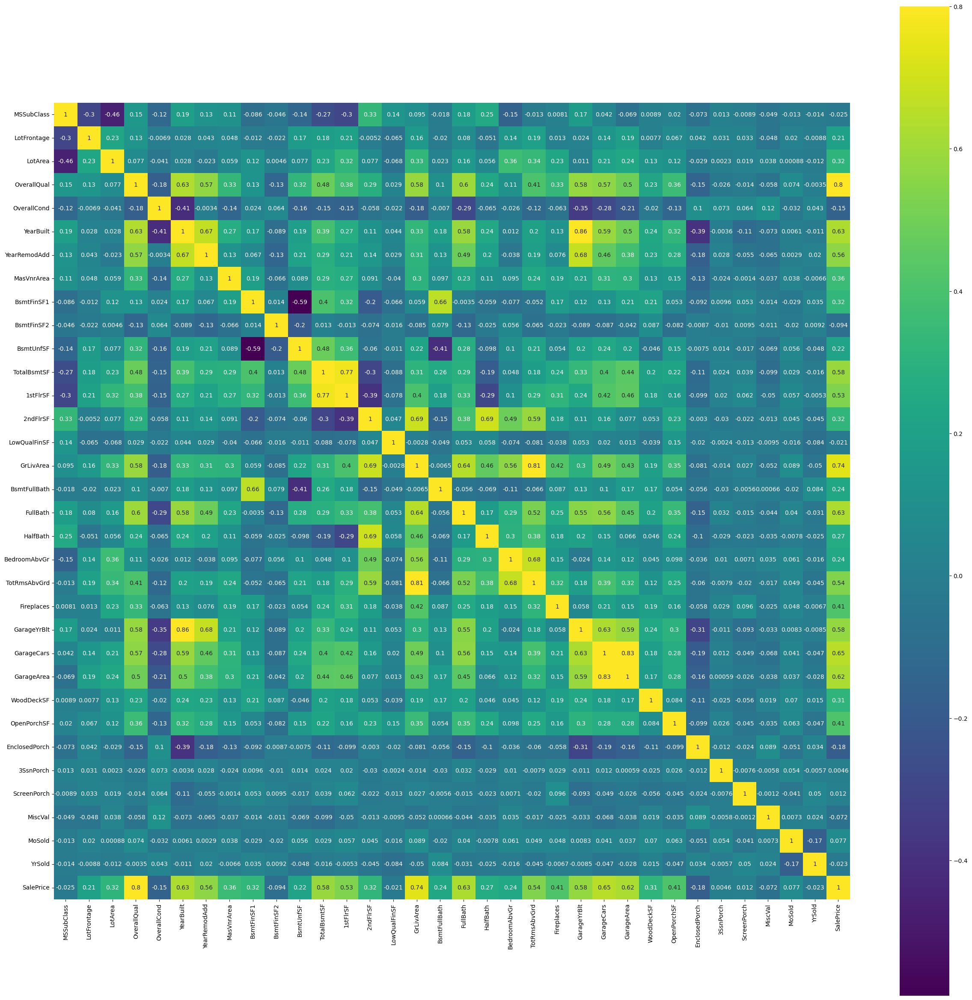

In [15]:
plt.figure(figsize=(30,30))
sns.heatmap(df.select_dtypes('number').corr(),vmax=.8, annot=True,square=True,cmap='viridis');

In [16]:
MSSubClass = df.groupby('MSSubClass')['SalePrice'].mean()
MSSubClassMap ={20 : '1-STORY 1946 & NEWER ALL STYLES',
               30 : '1-STORY 1945 & OLDER',
               40 : '1-STORY W/FINISHED ATTIC ALL AGES',
               45 : "1-1/2 STORY - UNFINISHED ALL AGES",
                50 : "1-1/2 STORY FINISHED ALL AGES",
                60 : "2-STORY 1946 & NEWER",
                70 : "2-STORY 1945 & OLDER",
                75 : "2-1/2 STORY ALL AGES",
                80 : "SPLIT OR MULTI-LEVEL",
                85 : "SPLIT FOYER",
                90 : "DUPLEX - ALL STYLES AND AGES",
               120 : "1-STORY PUD (Planned Unit Development) - 1946 & NEWER",
               150 : "1-1/2 STORY PUD - ALL AGES",
               160 : "2-STORY PUD - 1946 & NEWER",
               180 : "PUD - MULTILEVEL - INCL SPLIT LEV/FOYER",
               190 : "2 FAMILY CONVERSION - ALL STYLES AND AGES"}

index_list = MSSubClass.index.tolist()
fig =px.bar(y=MSSubClass.values, x=[MSSubClassMap[i] for i in index_list], labels={'x': 'MSSubClass','y':'Value'},color=MSSubClass.values)
fig.update_layout(title='Mean of SalePrice for each MSSubClass',width=1300, 
    height=1000 )
fig.show()

In [17]:
MSZoningMap={
    "A" : "Agriculture",
       "C (all)" : "Commercial",
       "FV" : "Floating Village Residential",
       "I" : "Industrial",
       "RH" : "Residential High Density",
       "RL" : "Residential Low Density",
       "RP" : "Residential Low Density Park", 
       "RM" : "Residential Medium Density"
}
index_list = df['MSZoning'].value_counts().index.tolist()

px.pie(values=df['MSZoning'].value_counts().values,names=[MSZoningMap[i] for i in index_list],title='Number of Houses with the Zonning Classification')

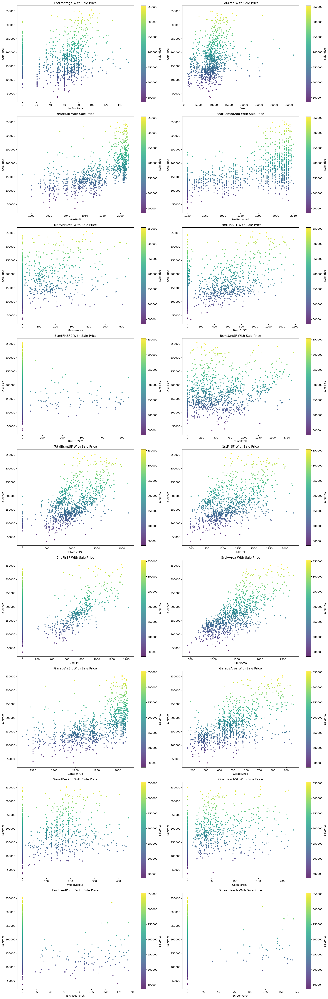

In [18]:
def plot_numeric_column_with_price(ax, x):
    scatter = ax.scatter(x=df[x], y=df['SalePrice'], c=df['SalePrice'], cmap='viridis', alpha=0.8, s=10)
    ax.set(xlabel=x, ylabel='SalePrice', title=f'{x} With Sale Price')
    plt.colorbar(scatter, ax=ax, label='SalePrice')

columns = []
for c in df.select_dtypes('number').columns.tolist():
    if df[f'{c}'].nunique() > 16:
        columns.append(c)
        
num_rows = math.ceil(len(columns[:-1]) / 2)
fig, axes = plt.subplots(num_rows, 2, figsize=(18, 6 * num_rows))
axes = axes.flatten()
for i, column in enumerate(columns[:-1]):
    if i >= len(axes):
        break
    plot_numeric_column_with_price(axes[i], column)

plt.tight_layout()
plt.show()


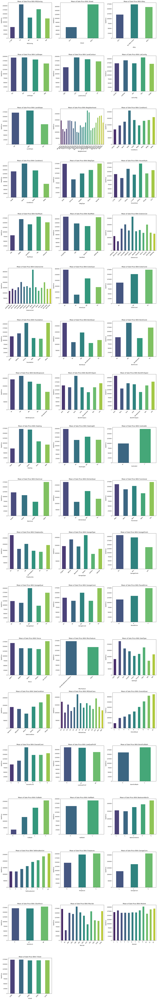

In [19]:
def plot_categorical_column_with_price(x, ax):
    mean = df.groupby(x)['SalePrice'].mean()
    sns.barplot(x=mean.index, y=mean.values, width=0.5, ax=ax,palette='viridis')
    ax.set_xlabel(x)
    ax.set_ylabel('SalePrice')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_title(f'Mean of Sale Price With {x}')

columns = df.select_dtypes(exclude='number').columns.tolist()
for c in df.select_dtypes('number').columns.tolist():
    if df[f'{c}'].nunique() <= 16:
        columns.append(c)

num_columns = 3
num_rows = (len(columns) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows))

for i, column in enumerate(columns):
    row = i // num_columns
    col = i % num_columns
    if num_rows > 1:
        ax = axes[row, col]
    else:
        ax = axes[col]
    plot_categorical_column_with_price(column, ax)

for i in range(len(columns), num_rows * num_columns):
    row = i // num_columns
    col = i % num_columns
    if num_rows > 1:
        fig.delaxes(axes[row, col])
    else:
        fig.delaxes(axes[col])

plt.tight_layout()
plt.show()


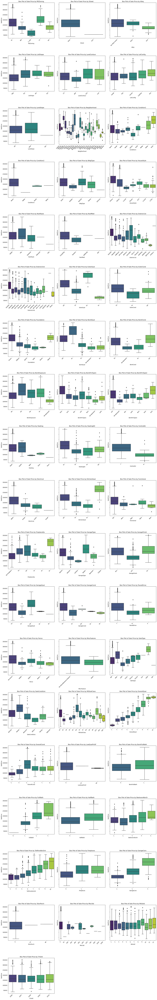

In [20]:
def box_plot_categorical_column_with_price(x, ax):
    sns.boxplot(x=x, y='SalePrice', data=df, ax=ax, palette='viridis')
    ax.set_xlabel(x)
    ax.set_ylabel('SalePrice')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_title(f'Box Plot of Sale Price by {x}')


columns = df.select_dtypes(exclude='number').columns.tolist()
for c in df.select_dtypes('number').columns.tolist():
    if df[f'{c}'].nunique() <= 16:
        columns.append(c)
        
num_columns = 3
num_rows = (len(columns) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows), sharey=True)
axes = axes.flatten()

for i, column in enumerate(columns):
    box_plot_categorical_column_with_price(column, axes[i])

for i in range(len(columns), num_rows * num_columns):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


# Preprocessing

## Encoding the data

In [21]:
df = pd.get_dummies(df,dtype=float,drop_first=True)

## Split the data

In [22]:
df.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_No Alley Acess,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Norm,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShngl,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Gd,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_No Basment,BsmtQual_TA,BsmtCond_Gd,BsmtCond_No Basment,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No Basment,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_No Basment,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_No Basment,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_GasA,Heating_GasW,Heating_Grav,Heating_Wall,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_No Fireplace,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_No Fence,MiscFeature_Shed,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,2,1,3,8,0,2003.0,2,548,0,61,0,0,0,0,2,2008,208500,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [23]:
index_to_exclude = df.columns.get_loc('SalePrice')
X = df.iloc[:, [i for i in range(df.shape[1]) if i != index_to_exclude]].values
y = df.iloc[:,index_to_exclude].values

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=329) 

## Apply Standardization on the data

In [25]:
X_train_nstd = X_train.copy()
X_test_nstd = X_test.copy()
y_train_nstd = y_train.copy()

sc_X = StandardScaler()
X_train[:, :34] = sc_X.fit_transform(X_train[:, :34])
X_test[:, :34] = sc_X.transform(X_test[:, :34])
sc_y = StandardScaler()
y_train = sc_y.fit_transform(y_train.reshape(-1,1)).flatten()

# Multi-Linear Regression

## Train the model

In [26]:
multi_lr = LinearRegression()
multi_lr.fit(X_train_nstd, y_train_nstd)

LinearRegression()

## Evaluate the model

In [27]:
y_pred = multi_lr.predict(X_test_nstd)
y_train_pred = multi_lr.predict(X_train_nstd)
r2_lr_train = r2_score(y_train_nstd, y_train_pred)
r2_lr_test = r2_score(y_test, y_pred.reshape(-1,1))
print("R2 Train Score:", r2_lr_train)
print("R2 Test Score:", r2_lr_test)
mse_lr_train = mean_squared_error(y_train_nstd, y_train_pred)
mse_lr_test = mean_squared_error(y_test, y_pred.reshape(-1,1))
print("Mean Squared Error of Train:", mse_lr_train)
print("Mean Squared Error of Test:", mse_lr_test)

R2 Train Score: 0.9464358681358875
R2 Test Score: 0.9073819142210803
Mean Squared Error of Train: 178354137.53381306
Mean Squared Error of Test: 285170799.0441916


# Polynomial Regression

## Training the model

In [28]:
poly_reg = PolynomialFeatures(degree = 2)
X_train_poly = poly_reg.fit_transform(X_train)
X_test_poly = poly_reg.transform(X_test)
poly_lr = LinearRegression()
poly_lr.fit(X_train_poly, y_train)

LinearRegression()

## Evaluation of the model

In [29]:
y_pred = poly_lr.predict(X_test_poly)
y_train_pred = poly_lr.predict(X_train_poly)
r2_poly_train = r2_score(y_train,y_train_pred)
r2_poly_test = r2_score(y_test,sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("R2 Train Score:", r2_poly_train)
print("R2 Test Score:", r2_poly_test)
mse_poly_train = mean_squared_error(y_train, y_train_pred)
mse_poly_test = mean_squared_error(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("Mean Squared Error of Train:", mse_poly_train)
print("Mean Squared Error of Test:", mse_poly_test)

R2 Train Score: 1.0
R2 Test Score: 0.8366158147519442
Mean Squared Error of Train: 1.6059204078093371e-28
Mean Squared Error of Test: 503059399.970636


# Decision Tree

## Training the model

In [30]:
dec_tree = DecisionTreeRegressor()
dec_tree.fit(X_train, y_train)

DecisionTreeRegressor()

## Evaluation of the model

In [31]:
y_pred = dec_tree.predict(X_test)
y_train_pred = dec_tree.predict(X_train)
r2_tree_train = r2_score(y_train, y_train_pred)
r2_tree_test = r2_score(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("R2 Train Score:", r2_tree_train)
print("R2 Test Score:", r2_tree_test)
mse_tree_train = mean_squared_error(y_train, y_train_pred)
mse_tree_test = mean_squared_error(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("Mean Squared Error of Train:", mse_tree_train)
print("Mean Squared Error of Test:", mse_tree_test)

R2 Train Score: 1.0
R2 Test Score: 0.700985689441165
Mean Squared Error of Train: 0.0
Mean Squared Error of Test: 920664135.4179105


# Random Forest

## Training the model

In [32]:
rdm_frst = RandomForestRegressor(n_estimators = 100)
rdm_frst.fit(X_train, y_train)

RandomForestRegressor()

## Evaluation of the model

In [33]:
y_pred = rdm_frst.predict(X_test)
y_train_pred = rdm_frst.predict(X_train)
r2_frst_train = r2_score(y_train, y_train_pred)
r2_frst_test = r2_score(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("R2 Train Score:", r2_frst_train)
print("R2 Test Score:", r2_frst_test)
mse_frst_train = mean_squared_error(y_train, y_train_pred)
mse_frst_test = mean_squared_error(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("Mean Squared Error of Train:", mse_frst_train)
print("Mean Squared Error of Test:", mse_frst_test)

R2 Train Score: 0.9839455702737209
R2 Test Score: 0.8764287215725783
Mean Squared Error of Train: 0.01605442972627916
Mean Squared Error of Test: 380475583.26972693


# Linear SVR

## Training the model

In [34]:
svr = SVR(kernel = 'linear')
svr.fit(X_train, y_train)

SVR(kernel='linear')

## Evaluation of the model

In [35]:
y_pred = svr.predict(X_test)
y_train_pred = svr.predict(X_train)
r2_svr_lr_train = r2_score(y_train, y_train_pred)
r2_svr_lr_test = r2_score(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("R2 Train Score:", r2_svr_lr_train)
print("R2 Test Score:", r2_svr_lr_test)
mse_svr_lr_train = mean_squared_error(y_train, y_train_pred)
mse_svr_lr_test = mean_squared_error(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("Mean Squared Error of Train:", mse_svr_lr_train)
print("Mean Squared Error of Test:", mse_svr_lr_test)

R2 Train Score: 0.9402721396938134
R2 Test Score: 0.9191414959865363
Mean Squared Error of Train: 0.05972786030618656
Mean Squared Error of Test: 248963083.23709303


# SVR

## Training the model

In [36]:
svr = SVR(kernel = 'rbf')
svr.fit(X_train, y_train)

SVR()

## Evaluation of the model

In [37]:
y_pred = svr.predict(X_test)
y_train_pred = svr.predict(X_train)
r2_svr_train = r2_score(y_train, y_train_pred)
r2_svr_test = r2_score(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("R2 Train Score:", r2_svr_train)
print("R2 Test Score:", r2_svr_test)
mse_svr_train = mean_squared_error(y_train, y_train_pred)
mse_svr_test = mean_squared_error(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("Mean Squared Error of Train:", mse_svr_train)
print("Mean Squared Error of Test:", mse_svr_test)

R2 Train Score: 0.9674357016934856
R2 Test Score: 0.8797500550200975
Mean Squared Error of Train: 0.03256429830651446
Mean Squared Error of Test: 370249207.87926495


# Ridge

## Training the model

In [38]:
ridge = Ridge()
ridge.fit(X_train, y_train)

Ridge()

## Evaluation of the model

In [39]:
y_pred = ridge.predict(X_test)
y_train_pred = ridge.predict(X_train)
r2_ridge_train = r2_score(y_train, y_train_pred)
r2_ridge_test = r2_score(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("R2 Train Score:", r2_ridge_train)
print("R2 Test Score:", r2_ridge_test)
mse_ridge_train = mean_squared_error(y_train, y_train_pred)
mse_ridge_test = mean_squared_error(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("Mean Squared Error of Train:", mse_ridge_train)
print("Mean Squared Error of Test:", mse_ridge_test)

R2 Train Score: 0.9445518451909053
R2 Test Score: 0.919696840398397
Mean Squared Error of Train: 0.05544815480909466
Mean Squared Error of Test: 247253179.5142599


# Lasso

## Training the model

In [40]:
lasso = Lasso(alpha=0.001)
lasso.fit(X_train, y_train)

Lasso(alpha=0.001)

## Evaluation of the model

In [41]:
y_pred = lasso.predict(X_test)
y_train_pred = lasso.predict(X_train)
r2_lasso_train = r2_score(y_train, y_train_pred)
r2_lasso_test = r2_score(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("R2 Train Score:", r2_lasso_train)
print("R2 Test Score:", r2_lasso_test)
mse_lasso_train = mean_squared_error(y_train, y_train_pred)
mse_lasso_test = mean_squared_error(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("Mean Squared Error of Train:", mse_lasso_train)
print("Mean Squared Error of Test:", mse_lasso_test)

R2 Train Score: 0.9368651891061947
R2 Test Score: 0.9220493217133328
Mean Squared Error of Train: 0.06313481089380535
Mean Squared Error of Test: 240009896.8370719


# XGBoost Regressor

## Training the model

In [42]:
xgb = XGBRegressor(learning_rate=0.2,gamma=0.2)
xgb.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.2, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.2, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

## Evaluation of the model

In [43]:
y_pred = xgb.predict(X_test)
y_train_pred = xgb.predict(X_train)
r2_xgb_train = r2_score(y_train, y_train_pred)
r2_xgb_test = r2_score(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("R2 Train Score:", r2_xgb_train)
print("R2 Test Score:", r2_xgb_test)
mse_xgb_train = mean_squared_error(y_train, y_train_pred)
mse_xgb_test = mean_squared_error(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("Mean Squared Error of Train:", mse_xgb_train)
print("Mean Squared Error of Test:", mse_xgb_test)

R2 Train Score: 0.9812460905716869
R2 Test Score: 0.8805404246761526
Mean Squared Error of Train: 0.01875390942831313
Mean Squared Error of Test: 367815662.1580167


# Neural Network

## Training the model

In [44]:
tf.random.set_seed(329)
np.random.seed(329)

nn_model = tf.keras.Sequential([
    tf.keras.layers.Dense(100),
    tf.keras.layers.Dense(100),
    tf.keras.layers.Dense(100),
    tf.keras.layers.Dense(100),
    tf.keras.layers.Dense(100),
    tf.keras.layers.Dense(1)
])

nn_model.compile(loss = tf.keras.losses.mae,
                optimizer=tf.keras.optimizers.Adam(lr=0.1),
                metrics=['mae','mse'])

history = nn_model.fit(X_train,y_train,epochs=200,verbose=2)


Epoch 1/200



25/25 - 5s - loss: 0.4972 - mae: 0.4972 - mse: 0.4597 - 5s/epoch - 192ms/step
Epoch 2/200
25/25 - 0s - loss: 0.3299 - mae: 0.3299 - mse: 0.1883 - 178ms/epoch - 7ms/step
Epoch 3/200
25/25 - 0s - loss: 0.2619 - mae: 0.2619 - mse: 0.1271 - 179ms/epoch - 7ms/step
Epoch 4/200
25/25 - 0s - loss: 0.2629 - mae: 0.2629 - mse: 0.1220 - 180ms/epoch - 7ms/step
Epoch 5/200
25/25 - 0s - loss: 0.2427 - mae: 0.2427 - mse: 0.1074 - 177ms/epoch - 7ms/step
Epoch 6/200
25/25 - 0s - loss: 0.2254 - mae: 0.2254 - mse: 0.0994 - 173ms/epoch - 7ms/step
Epoch 7/200
25/25 - 0s - loss: 0.2328 - mae: 0.2328 - mse: 0.1015 - 172ms/epoch - 7ms/step
Epoch 8/200
25/25 - 0s - loss: 0.2193 - mae: 0.2193 - mse: 0.0904 - 184ms/epoch - 7ms/step
Epoch 9/200
25/25 - 0s - loss: 0.2084 - mae: 0.2084 - mse: 0.0846 - 189ms/epoch - 8ms/step
Epoch 10/200
25/25 - 0s - loss: 0.2137 - mae: 0.2137 - mse: 0.0892 - 183ms/epoch - 7ms/step
Epoch 11/200
25/25 - 0s - loss: 0.2191 - mae: 0.2191 - mse: 0.0898 - 233ms/epoch - 9ms/step
Epoch 12/2

In [45]:
nn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (32, 100)                 22100     
                                                                 
 dense_1 (Dense)             (32, 100)                 10100     
                                                                 
 dense_2 (Dense)             (32, 100)                 10100     
                                                                 
 dense_3 (Dense)             (32, 100)                 10100     
                                                                 
 dense_4 (Dense)             (32, 100)                 10100     
                                                                 
 dense_5 (Dense)             (32, 1)                   101       
                                                                 
Total params: 62601 (244.54 KB)
Trainable params: 62601 

## Evaluation of the model

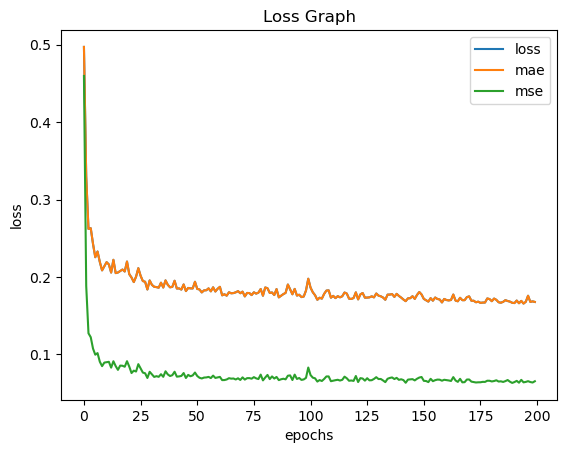

In [46]:
pd.DataFrame(history.history).plot()
plt.title('Loss Graph')
plt.ylabel('loss')
plt.xlabel('epochs');

In [47]:
y_pred = nn_model.predict(X_test)
y_train_pred = nn_model.predict(X_train)
r2_nn_train = r2_score(y_train, y_train_pred)
r2_nn_test = r2_score(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("R2 Train Score:", r2_nn_train)
print("R2 Test Score:", r2_nn_test)
mse_nn_train = mean_squared_error(y_train, y_train_pred)
mse_nn_test = mean_squared_error(y_test, sc_y.inverse_transform(y_pred.reshape(-1,1)))
print("Mean Squared Error of Train:", mse_nn_train)
print("Mean Squared Error of Test:", mse_nn_test)

25/25 [==============================] - 0s 5ms/step
R2 Train Score: 0.9385232674856971
R2 Test Score: 0.919535915300265
Mean Squared Error of Train: 0.06147673251430279
Mean Squared Error of Test: 247748667.39262214


# Comparing Models

In [48]:
models = pd.DataFrame({
    'Model': [
        'Multiple Linear Regression','Polynomial Regression','Decision Tree',
        'Random Forest', 'Support Vector Regression','Linear Support Vector Regression','Ridge','Lasso','XGBoost','Neural Network'
    ],
    'Training R2 Score': [
        r2_lr_train,r2_poly_train,r2_tree_train,r2_frst_train,r2_svr_train,r2_svr_lr_train,r2_ridge_train,r2_lasso_train,r2_xgb_train,r2_nn_train
    ],
    'Training Mean Square Error': [
       mse_lr_train,mse_poly_train,mse_tree_train,mse_frst_train,mse_svr_train,mse_svr_lr_train,mse_ridge_train,mse_lasso_train,mse_xgb_train,mse_nn_train
    ],
    'Testing R2 Score': [
        r2_lr_test,r2_poly_test,r2_tree_test,r2_frst_test,r2_svr_test,r2_svr_lr_test,r2_ridge_test,r2_lasso_test,r2_xgb_test,r2_nn_test
    ],
    'Testing Mean Square Error': [
       mse_lr_test,mse_poly_test,mse_tree_test,mse_frst_test,mse_svr_test,mse_svr_lr_test,mse_ridge_test,mse_lasso_test,mse_xgb_test,mse_nn_test
    ]
})

In [49]:
models.sort_values(by='Testing R2 Score', ascending=False).style.background_gradient(
        cmap='Blues')

,Model,Training R2 Score,Training Mean Square Error,Testing R2 Score,Testing Mean Square Error
7,Lasso,0.936865,0.063135,0.922049,240009896.837072
6,Ridge,0.944552,0.055448,0.919697,247253179.514260
9,Neural Network,0.938523,0.061477,0.919536,247748667.392622
5,Linear Support Vector Regression,0.940272,0.059728,0.919141,248963083.237093
0,Multiple Linear Regression,0.946436,178354137.533813,0.907382,285170799.044192
8,XGBoost,0.981246,0.018754,0.880540,367815662.158017
4,Support Vector Regression,0.967436,0.032564,0.879750,370249207.879265
3,Random Forest,0.983946,0.016054,0.876429,380475583.269727
1,Polynomial Regression,1.000000,0.000000,0.836616,503059399.970636
2,Decision Tree,1.000000,0.000000,0.700986,920664135.417910
